# Assignment 1 - Social Media and Network Analysis (COSC2671)

**Topic:** Anime  
**Student ID:** s4083242  
**Name:** Mayank Kantharia  
**Dataset:** Reddit posts and comments from r/anime  
**Objective:** To collect, clean, analyze, and visualize Reddit data related to the anime in order to uncover linguistic trends, sentiment patterns, and topical structures.


In [1]:
# Importing libraries
import sys
import json
import praw
import math
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pyLDAvis
import pyLDAvis.lda_model
from itertools import chain
from textblob import TextBlob
from wordcloud import WordCloud
from collections import Counter
from praw.models import MoreComments

# Importing Scikit-learn libraries
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Importing NLTK libraries
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Downloading NLTK stopwords
nltk.download('stopwords')
nltk.download('vader_lexicon')

# Ignoring warnings
import warnings
warnings.filterwarnings("ignore")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mayan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\mayan\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("seaborn-v0_8")

# Setting aesthetic parameters for plots
sns.set_theme(style="whitegrid")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['figure.figsize'] = (16, 10)
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'

## Data Collection

Reddit data was collected using the PRAW API from the `r/anime` subreddit. Each post contains metadata like title, selftext, score, and upvote ratio, along with the top-level comments.

Only the first 500 posts were fetched for processing, and I saved only 200 to JSON for testing and reproducibility.


In [ ]:
# The below function is to draw dashed line
def draw_line(n):
    print("-" * n)

# Function to get the Reddit client
def reddit_client():
    try:
        clientId = "8NZwxb2DL0Djse2F1tDu-g"
        clientSecret = "byOnBw8r3m44veyuhb3bXXsPvXi5Pg"
        password = "Witcher@100"
        userName = "Intelligent_Sort366"
        userAgents = 'client for SNAM2024'

        reddit_client = praw.Reddit(
            client_id = clientId,
            client_secret = clientSecret,
            password = password,
            username = userName,
            user_agent = userAgents
        )    

    except KeyError:
        sys.stderr.write("Key or secret token are invalid.\n")
        sys.exit(1)

    return reddit_client

# Extract posts from the subreddit
def extract_reddit_posts(post_limit, subreddit,  comment_limit, subreddit_name):    
    posts_data = []
    try:
        # Fetching the new posts from the subreddit
        draw_line(70)
        print(f"Fetching new {post_limit} posts from r/{subreddit_name}...")
        draw_line(70)
        for submission in subreddit.new(limit=post_limit):
            post_info = {
            'title': submission.title,
            'selftext': submission.selftext,
            'score': submission.score,
            'upvote_ratio': submission.upvote_ratio,
            'author': str(submission.author),
            'created_utc': submission.created_utc,
            'num_comments': submission.num_comments,
            'flair': submission.link_flair_text,
            'comments': []
        }
            submission.comments.replace_more(limit=0)
            for comment in submission.comments.list():
                if isinstance(comment, MoreComments):
                    continue
                post_info['comments'].append({
                    'comment_score': comment.score,
                    'comment_body': comment.body,
                })

            # Append the post information to the list
            posts_data.append(post_info)
            print(f"Processed post {len(posts_data)}/{post_limit}: {submission.title[:50]}...")
    except Exception as e:
        print(f"Error: {e}")
    return posts_data


In [4]:
# subreddit name I am interested in
subreddit_name = 'anime'

# Number of posts to retrieve
num_posts = 500

# Constructing Reddit client
client = reddit_client()

# Specify which subreddit I am interested in
subreddit = client.subreddit(subreddit_name)

# comment limit: Fetch only the top 10 comments for each post
comment_limit = 25

# Output file name
output_file=f"{subreddit_name}_posts_{num_posts}.json"

In [5]:
# Running the extraction
posts_data = extract_reddit_posts(
    post_limit=num_posts, 
    subreddit=subreddit, 
    comment_limit=comment_limit, 
    subreddit_name=subreddit_name
)

----------------------------------------------------------------------
Fetching new 500 posts from r/anime...
----------------------------------------------------------------------
Processed post 1/500: A Silent Voice - Amazon Prime...
Processed post 2/500: Seeking Recommendations on Anime...
Processed post 3/500: I need vampire yuri, please!...
Processed post 4/500: Watch or re watch?...
Processed post 5/500: Rent-a-Girlfriend Season 4 Ruka Sarashina Characte...
Processed post 6/500: How to start watching Detective Conan?...
Processed post 7/500: Looking for anime suggestions to watch...
Processed post 8/500: Does anyone have any recommendations?...
Processed post 9/500: Anime recommendations like Frieren...
Processed post 10/500: Fantasy or Isekai Reccomendations...
Processed post 11/500: Dose anyone have a good anime to watch?...
Processed post 12/500: Looking for an anime based on a quote....
Processed post 13/500: Romance anime with no love triangle...
Processed post 14/500: Yu-gi

In [6]:
# Storing the posts in a DataFrame
df_posts = pd.DataFrame(posts_data)

# Saving posts to a JSON file
with open(output_file, 'w', encoding='utf-8') as f:
    json.dump({"posts": posts_data[:200]}, f, ensure_ascii=False, indent=4)
draw_line(70)
print(f"Success! Saved {len(posts_data)} posts to {output_file}.")
draw_line(70)

----------------------------------------------------------------------
Success! Saved 500 posts to anime_posts_500.json.
----------------------------------------------------------------------


In [7]:
# Printing column names in the DataFrame
draw_line(50)
print("Columns in the DataFrame:")
draw_line(50)
for col in df_posts.columns:
    print(f"- {col}")

--------------------------------------------------
Columns in the DataFrame:
--------------------------------------------------
- title
- selftext
- score
- upvote_ratio
- author
- created_utc
- num_comments
- flair
- comments


## Text Preprocessing

I combined post titles, bodies, and top-level comments into a unified `full_text` field for analysis.

Preprocessing steps:
- Lowercasing
- Tokenization using regex
- Removal of digits and punctuation
- Stemming using `PorterStemmer`
- Stopword removal
- Removed bot-generated messages like "I am a bot"


In [8]:
# Setting up the required initializations for text processing
pattern = r"[a-zA-Z]+(?:[-'][a-zA-Z]+)?"
tokenizer = RegexpTokenizer(pattern)
stemmer = PorterStemmer()
list_punct = list(string.punctuation)
list_stopwords = stopwords.words('english') + list_punct + ['via']

# Function to combine title + selftext + comments into one field
def combine_post_and_comments(row):
    comments_text = " ".join([comment.get('comment_body', '') for comment in row.get('comments', [])])
    return f"{row['title']} {row['selftext']} {comments_text}"

df_posts["full_text"] = df_posts.apply(combine_post_and_comments, axis=1)

# Remove "i am a bot" text from the comments
df_posts["full_text"] = df_posts["full_text"].str.replace("i am a bot", "", case=False, regex=False)

# Remove "bot" word from the comments
df_posts["full_text"] = df_posts["full_text"].str.replace("bot", "", case=False, regex=False)

# Function to process text
def process_text(text, tokenizer, stemmer, stopwords):
    tokens = tokenizer.tokenize(text.lower())                    
    tokens = [token for token in tokens if len(token) > 1 and not token.isdigit()]
    stemmed_tokens = set([stemmer.stem(tok) for tok in tokens])
    return [tok for tok in stemmed_tokens if tok not in stopwords]

# Apply text processing
df_posts["processed_tokens"] = df_posts["full_text"].apply(lambda x: process_text(x, tokenizer, stemmer, list_stopwords))

all_words = [word for tokens in df_posts["processed_tokens"] for word in tokens]
word_freq = Counter(all_words)

# Remove rare words (frequency = 1)
words_to_keep = {word for word, count in word_freq.items() if count > 1}
df_posts["processed_tokens"] = df_posts["processed_tokens"].apply(lambda tokens: [w for w in tokens if w in words_to_keep])

# Create clean string text for sentiment and word cloud
df_posts["clean_text"] = df_posts["processed_tokens"].apply(lambda tokens: " ".join(tokens))

## Basic Text Statistics & Comment Analysis

I computed key statistics to better understand the structure and richness of the processed Reddit text.

### Text Statistics
For the main post content (titles, bodies, and comments), I calculated:

- **Vocabulary size**: Total number of unique tokens across all texts  
- **Total tokens**: All words after preprocessing  
- **Lexical diversity**: The ratio of unique words to total words  
- **Average text length**: Mean number of tokens per post  
- **Text length range**: Minimum and maximum tokens across posts  

Lexical diversity is a useful indicator of language richness — a higher score suggests more varied word usage.


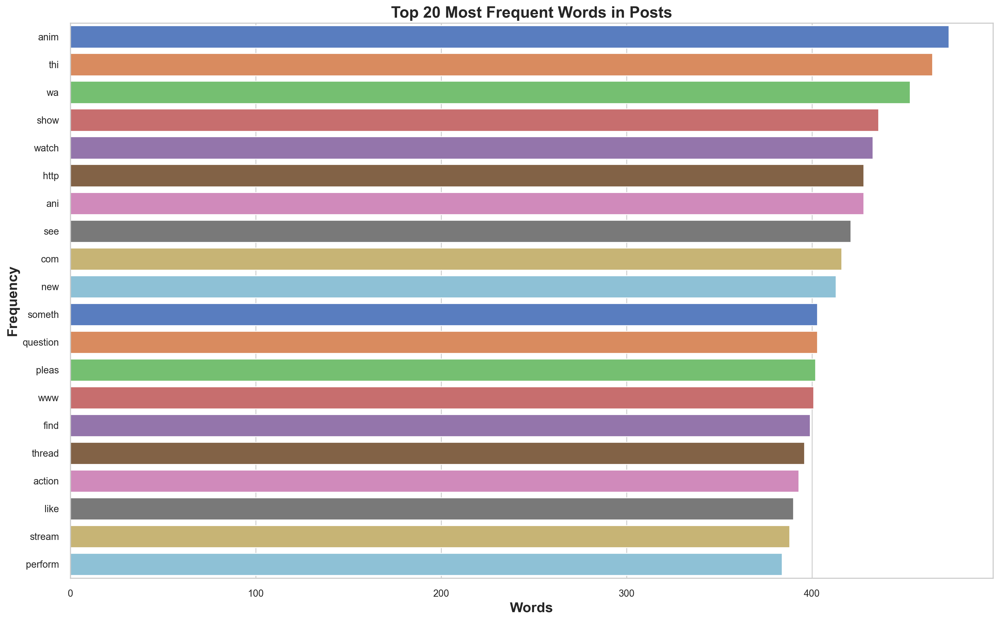

In [41]:
# Top 20 most frequent words in the document collection
top_20_words = {word:count for word, count in word_freq.most_common(20)}

# Plotting the top 20 most frequent words
sns.barplot(x=list(top_20_words.values()), y=list(top_20_words.keys()), palette='muted', hue=list(top_20_words.keys()), orient='horizontal')
plt.title('Top 20 Most Frequent Words in Posts')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [10]:
# Funtiion to print statistics of the processed text
def stats_print(clean_text):
    tokenized = [text.split() for text in clean_text]
    words = [word for text in tokenized for word in text]
    vocab = set(words)
    lexical_diversity = len(vocab) / len(words) if words else 0 # Calculating lexical diversity

    # Printing statistics
    print("Vocabulary size:".ljust(40), len(vocab))
    print("Total number of tokens:".ljust(40), len(words))
    print("Lexical diversity:".ljust(40), lexical_diversity)
    print("Total number of text:".ljust(40), len(clean_text))
    lens = [len(article) for article in clean_text] # Calculating lengths of each review
    
    # Printing text length statistics
    print("Average text length:".ljust(40), np.mean(lens) if lens else 0)
    print("Maximum text length:".ljust(40), np.max(lens) if lens else 0)
    print("Minimum text length:".ljust(40), np.min(lens) if lens else 0)
    print("Standard deviation of text length:".ljust(40), np.std(lens) if lens else 0)

In [11]:
processed_tokens = df_posts["clean_text"]
draw_line(70)
print('Statistics of words'.center(70))
draw_line(70)
stats_print(processed_tokens)
draw_line(70)

----------------------------------------------------------------------
                         Statistics of words                          
----------------------------------------------------------------------
Vocabulary size:                         9758
Total number of tokens:                  159688
Lexical diversity:                       0.061106657983066984
Total number of text:                    500
Average text length:                     1986.882
Maximum text length:                     16517
Minimum text length:                     23
Standard deviation of text length:       2645.0837582345102
----------------------------------------------------------------------


### Comment Analysis
Each post contains top-level comments, which I extracted and analyzed separately to explore engagement and sentiment patterns.

I computed:

- **Total number of comments**
- **Average comments per post**
- **Sentiment distribution** using VADER (Positive, Neutral, Negative)
- **Lexical diversity within comments**

These insights help highlight how users respond to One Piece-related content, not just through the original posts, but also through their conversations in the comment threads.


In [12]:
# Printing Total number of posts
total_posts = len(df_posts)

# Extracting the comments column
comments_column = df_posts['comments']
total_comments = sum(len(row) for row in comments_column)

# Total number of data: posts + comments
total_data = total_posts + total_comments

# Printing the total number of comments
draw_line(70)
print(f"Total number of posts   : {total_posts}")

# Printing the total number of comments
print(f"\nTotal number of comments: {total_comments}")

# Printing the total number of data: posts + comments
print(f"\nTotal number of data    : {total_data}")
draw_line(70)

----------------------------------------------------------------------
Total number of posts   : 500

Total number of comments: 15940

Total number of data    : 16440
----------------------------------------------------------------------


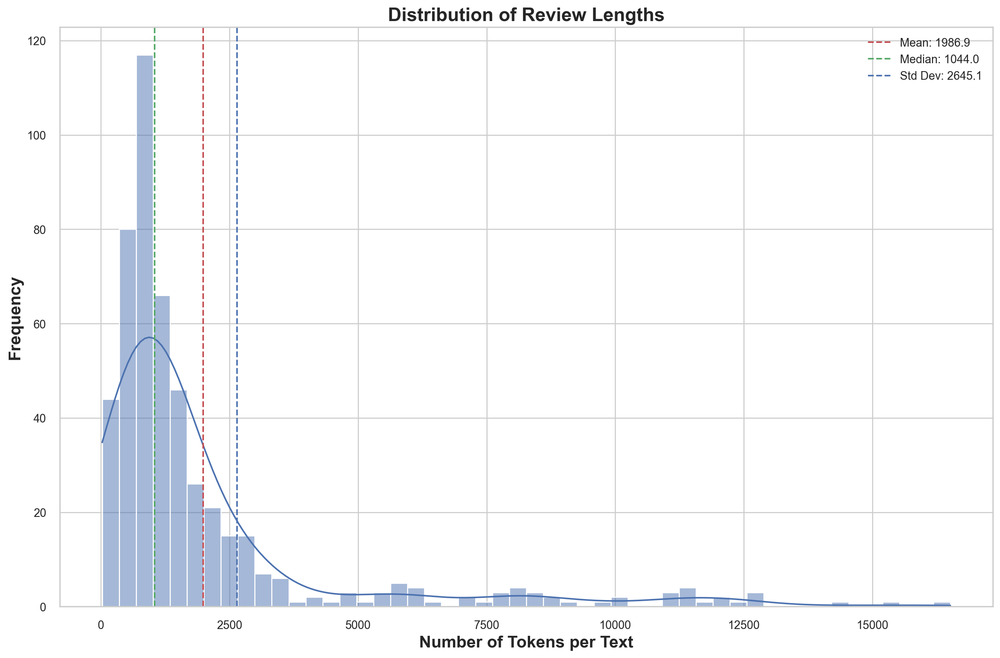

In [13]:
sns.histplot([len(review) for review in processed_tokens], bins=50, kde=True)
plt.title('Distribution of Review Lengths')
plt.xlabel('Number of Tokens per Text')
plt.ylabel('Frequency')
plt.axvline(np.mean([len(review) for review in processed_tokens]), color='r', linestyle='--', label=f'Mean: {np.mean([len(review) for review in processed_tokens]):.1f}')
plt.axvline(np.median([len(review) for review in processed_tokens]), color='g', linestyle='--', label=f'Median: {np.median([len(review) for review in processed_tokens]):.1f}')
plt.axvline(np.std([len(review) for review in processed_tokens]), color='b', linestyle='--', label=f'Std Dev: {np.std([len(review) for review in processed_tokens]):.1f}')
plt.legend()
plt.show()

## Lexical Diversity Over Time

To better understand how the variety of language changes throughout the day, I calculated lexical diversity on an hourly basis. This approach groups all posts made within each hour and computes the ratio of unique words to total words. The resulting trend reveals how language richness fluctuates in shorter time frames, potentially aligning with posting patterns such as episode releases, news drops, or active community discussions. This finer-grained analysis provides a more dynamic view of user engagement and linguistic behavior in the anime subreddit.


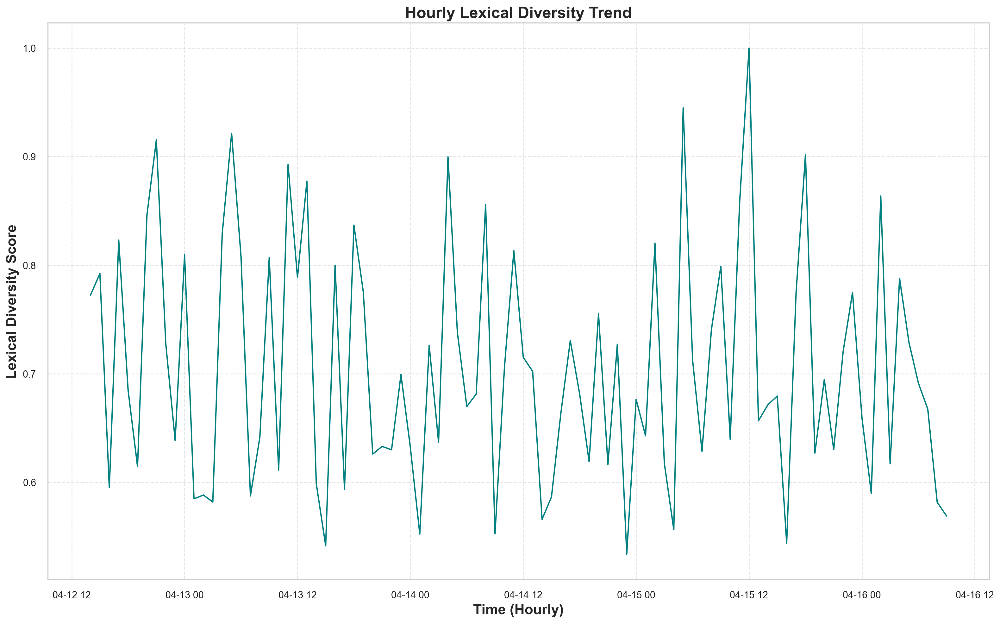

In [ ]:
# Assuming df_posts has a 'created_utc' column
df_posts['date'] = pd.to_datetime(df_posts['created_utc'], unit='s')

# Grouping by hour instead of date
hourly_diversity = df_posts.groupby(df_posts['date'].dt.floor('H'))['clean_text'] \
    .apply(lambda x: len(set(" ".join(x).split())) / len(" ".join(x).split()) if len(" ".join(x).split()) > 0 else 0)

# Plotting the hourly trend
plt.plot(hourly_diversity.index, hourly_diversity.values, color='teal')
plt.title('Hourly Lexical Diversity Trend')
plt.xlabel('Time (Hourly)')
plt.ylabel('Lexical Diversity Score')
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

## Post frequency over time
I also analyzed the frequency of posts over time to identify any spikes or trends in activity. This can help correlate with specific events, such as new episode releases or significant announcements in the anime community. By visualizing this data, we can better understand how user engagement varies and what might be driving these changes.

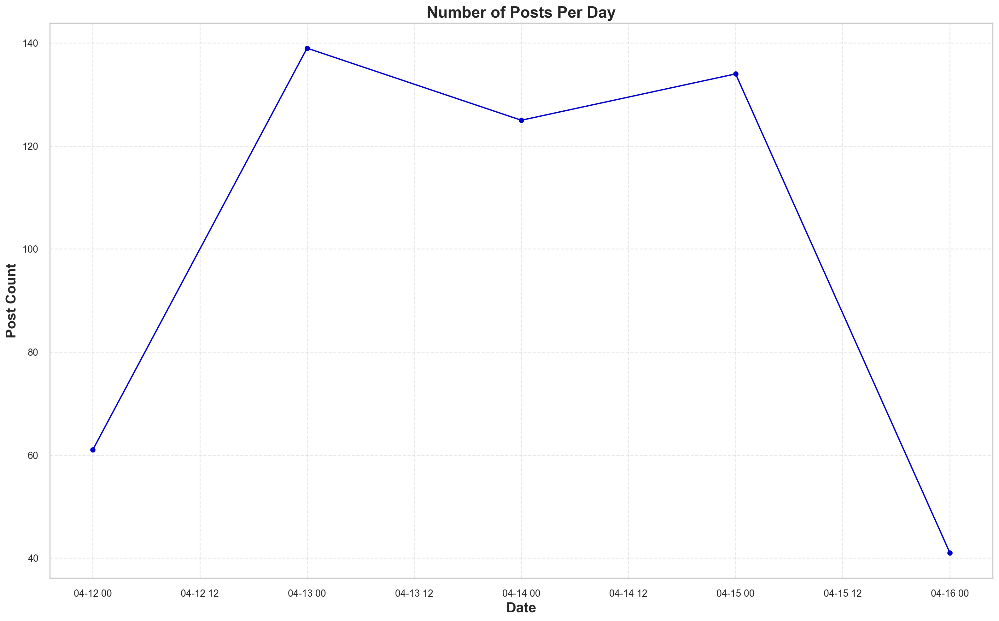

In [39]:
# Group by date (day)
daily_post_counts = df_posts.groupby(df_posts['date'].dt.date).size()

# Plotting the daily post counts
plt.plot(daily_post_counts.index, daily_post_counts.values, marker='o', color='mediumblue')
plt.title('Number of Posts Per Day')
plt.xlabel('Date')
plt.ylabel('Post Count')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

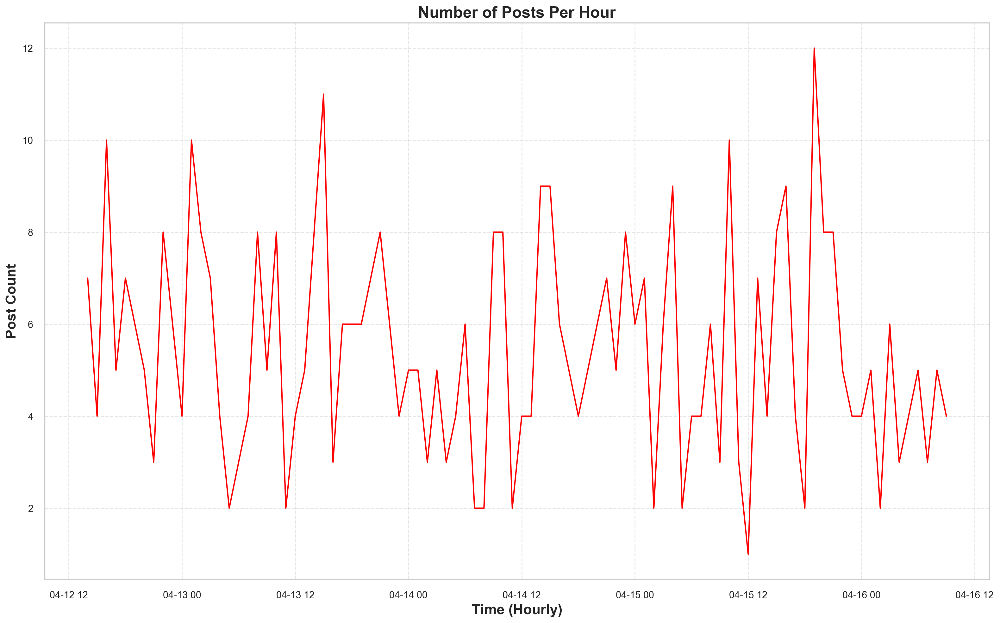

In [40]:
# Grouping by hour
hourly_post_counts = df_posts.groupby(df_posts['date'].dt.floor('H')).size()

# Plotting the number of posts per hour
plt.plot(hourly_post_counts.index, hourly_post_counts.values, color='red')
plt.title('Number of Posts Per Hour')
plt.xlabel('Time (Hourly)')
plt.ylabel('Post Count')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## Word Cloud Visualization

I created a word cloud to visualize the most frequently used words in the dataset. This provides an intuitive way to see which terms are most prevalent in discussions about One Piece.

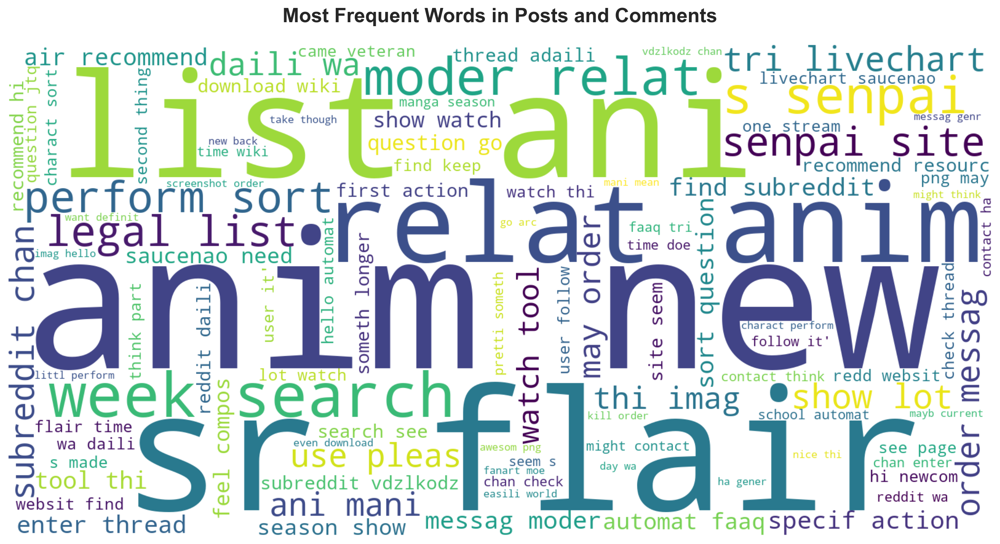

In [15]:
wordcloud = WordCloud(width=1600, height=800, background_color='white', max_words=100).generate(" ".join(processed_tokens))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words in Posts and Comments', pad=20)
plt.axis('off')
plt.show()

## Analysis of other important features
I also explored other features like post score, upvote ratio, and comment count to see how they correlate with lexical diversity and sentiment. This can help us understand what types of posts generate more engagement and positive sentiment in the One Piece community.

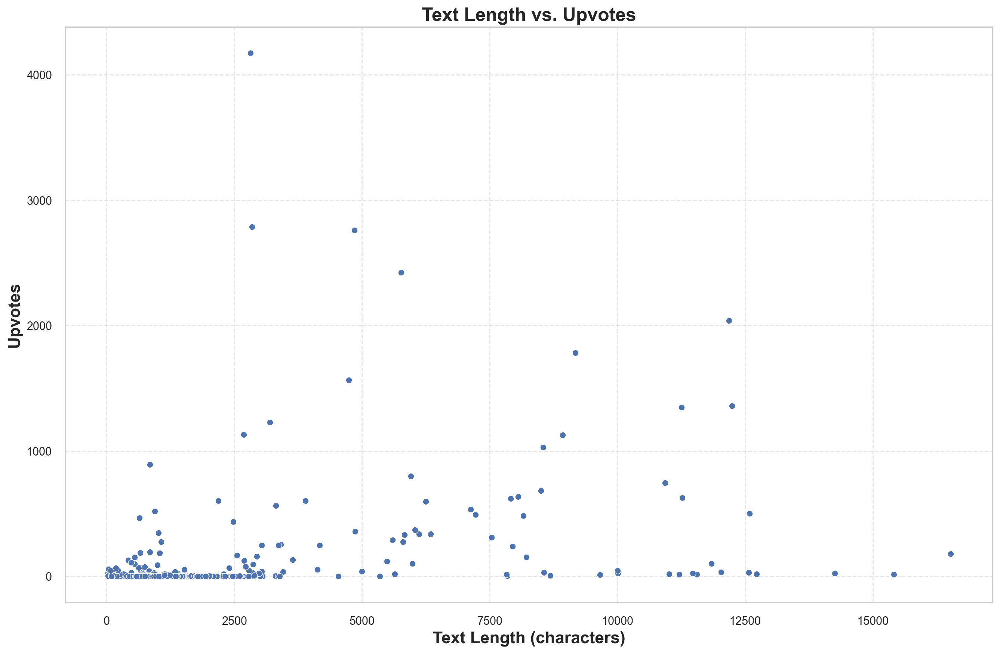

In [16]:
sns.scatterplot(x=df_posts['clean_text'].str.len(), y=df_posts['score'])
plt.title('Text Length vs. Upvotes')
plt.xlabel('Text Length (characters)')
plt.ylabel('Upvotes')
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

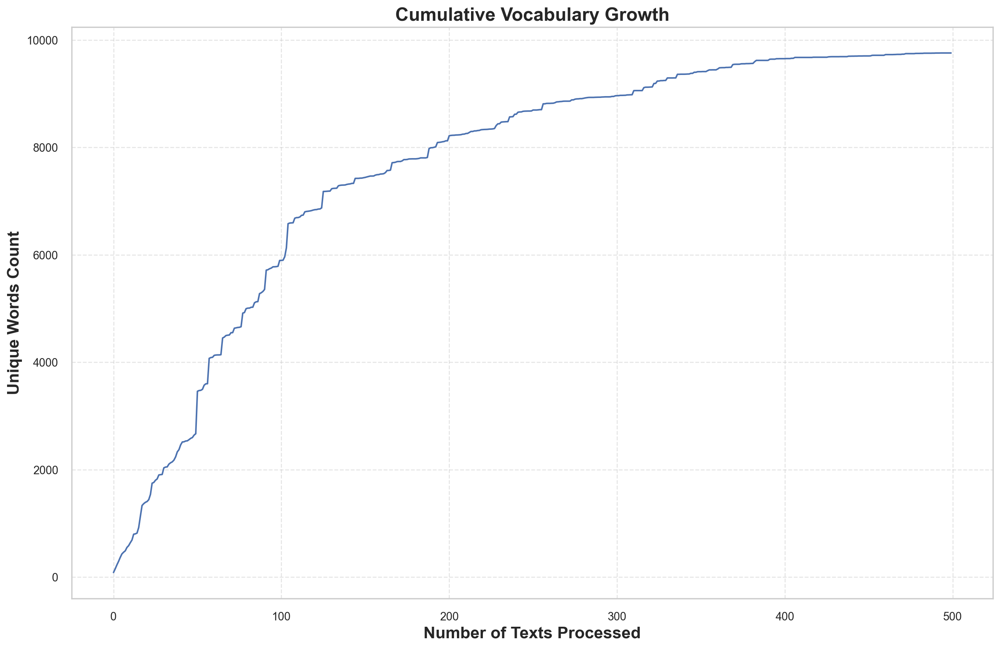

In [17]:
vocab = set()
vocab_growth = []

for i, review in enumerate(processed_tokens):
    vocab.update(review.split())
    vocab_growth.append(len(vocab))

plt.plot(vocab_growth)
plt.title('Cumulative Vocabulary Growth')
plt.xlabel('Number of Texts Processed')
plt.ylabel('Unique Words Count')
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

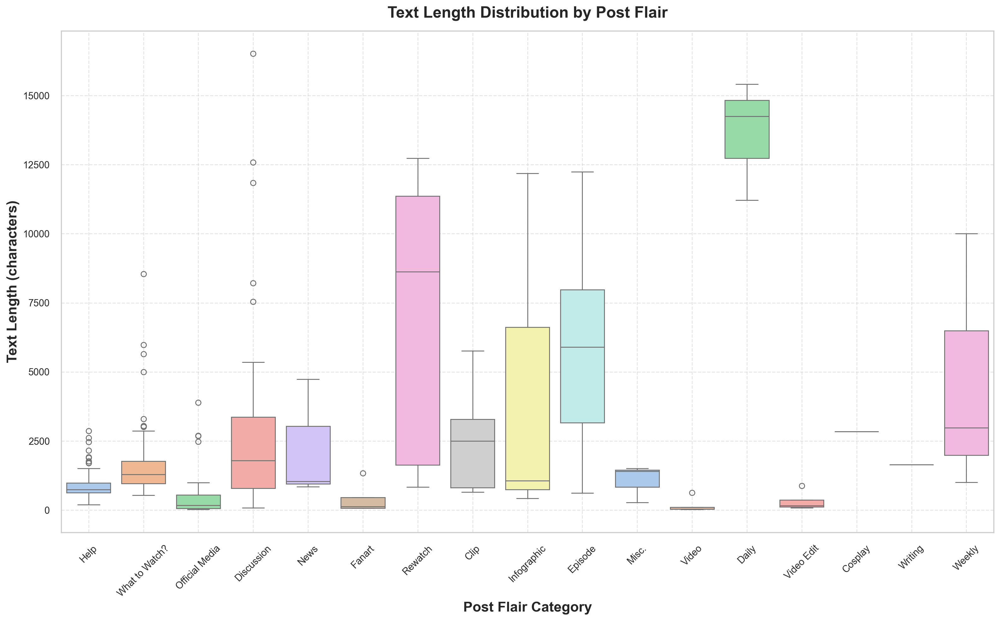

In [18]:
sns.boxplot(x=df_posts['flair'],  # Using flair column as categories
            y=df_posts['clean_text'].str.len(),
            palette='pastel', hue=df_posts['flair'])
plt.title('Text Length Distribution by Post Flair', pad=15)
plt.xlabel('Post Flair Category')
plt.ylabel('Text Length (characters)')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

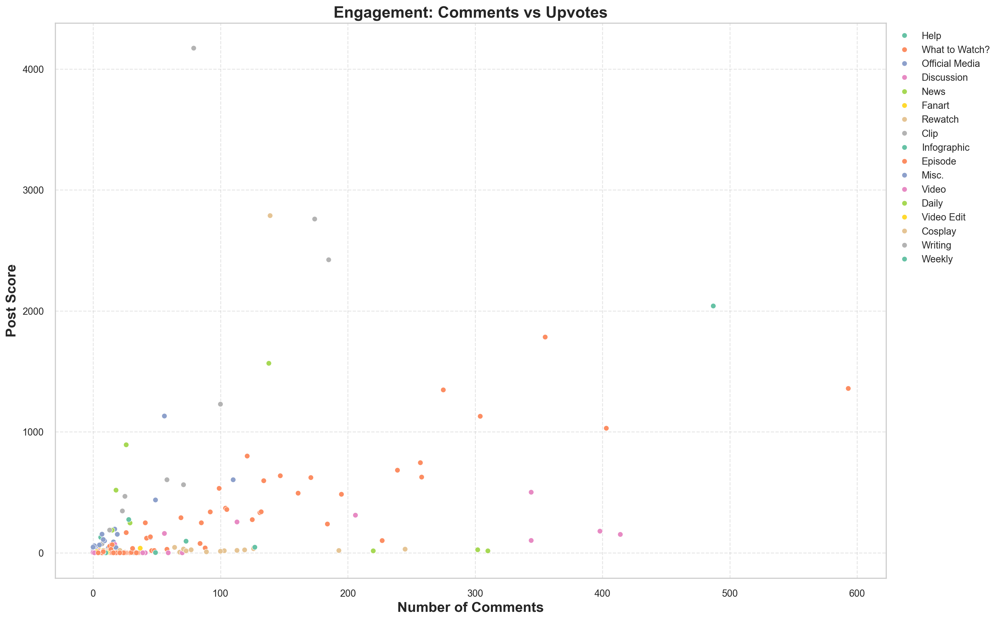

In [19]:
sns.scatterplot(data=df_posts, x='num_comments', y='score', hue='flair', palette='Set2')
plt.title('Engagement: Comments vs Upvotes')
plt.xlabel('Number of Comments')
plt.ylabel('Post Score')
plt.legend(bbox_to_anchor=(1.0, 1), loc='upper left')
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

## Sentiment Analysis

I applied VADER (Valence Aware Dictionary and sEntiment Reasoner) to the cleaned text.

Sentiments were categorized as:
- **Positive**
- **Neutral**
- **Negative**

I then plotted how each sentiment evolved over time using a 3-panel line chart, helping to visualize mood shifts across posts.


In [20]:
# Initializing VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Applying VADER sentiment scoring
df_posts["sentiment_score"] = df_posts["clean_text"].apply(lambda x: sid.polarity_scores(x)["compound"])

# Classifying sentiment
def classify_sentiment(score):
    if score >= 0.1:
        return "Positive"
    elif score <= -0.1:
        return "Negative"
    return "Neutral"

# Classifying sentiment based on the score
df_posts["sentiment"] = df_posts["sentiment_score"].apply(classify_sentiment)


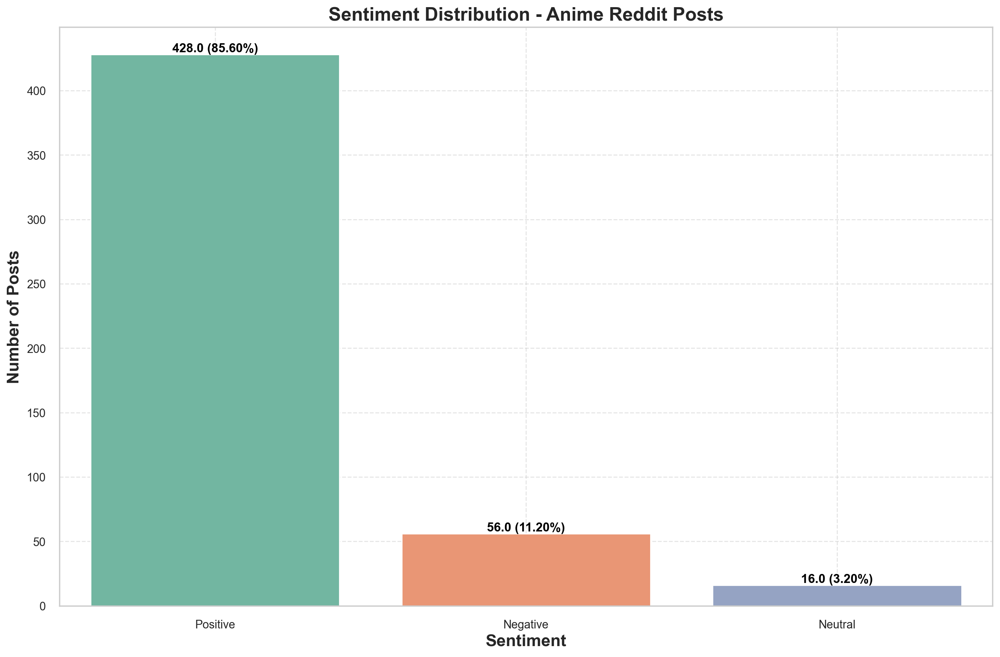

In [21]:
ax = sns.countplot(data=df_posts, x='sentiment', palette='Set2', hue='sentiment')
plt.title("Sentiment Distribution - Anime Reddit Posts")
plt.xlabel("Sentiment")
plt.ylabel("Number of Posts")
plt.grid(True, linestyle="--", alpha=0.5)
total = len(df_posts)
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total) * 100
    ax.text(p.get_x() + p.get_width() / 2, height + 2, f'{height} ({percentage:.2f}%)',
            ha='center', fontweight='bold', color='black')
plt.show()

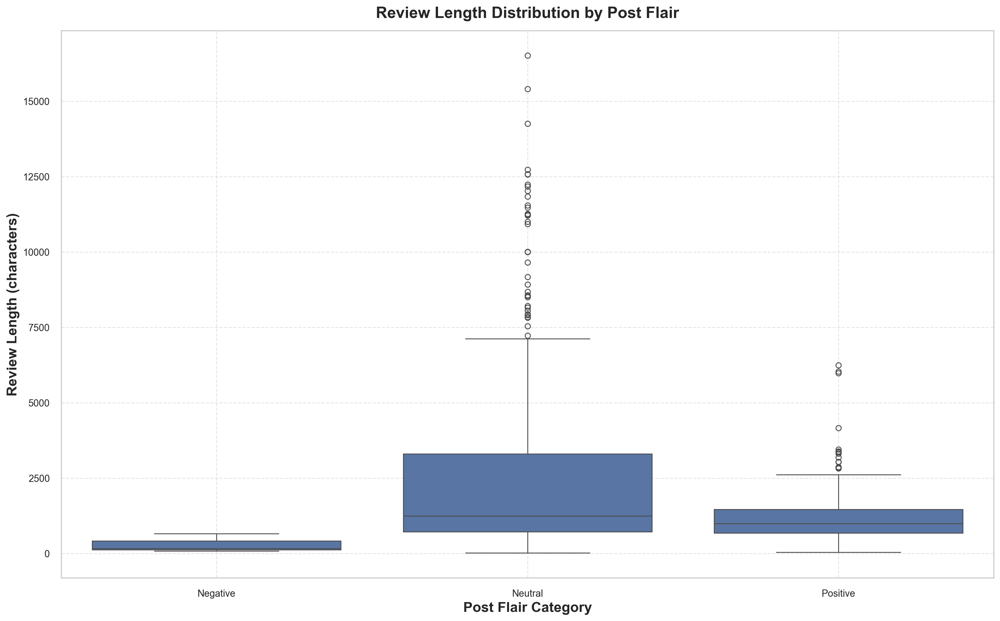

In [22]:
df_posts['sentiment'] = df_posts['clean_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
df_posts['sentiment_category'] = pd.cut(df_posts['sentiment'], bins=[-1, -0.1, 0.1, 1], labels=['Negative', 'Neutral', 'Positive'])
sns.boxplot(x=df_posts['sentiment_category'], y=df_posts['clean_text'].str.len())
plt.title('Review Length Distribution by Post Flair', pad=15)
plt.xlabel('Post Flair Category')
plt.ylabel('Review Length (characters)')
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

## Topic Modeling (LDA)

I used Latent Dirichlet Allocation (LDA) to uncover hidden topics in the Reddit posts.

I visualized:
- Top words per topic
- WordClouds for each topic
- pyLDAvis interactive panel for topic inspection


In [45]:
# Initilizing the corpus for LDA
corpus = df_posts["clean_text"].tolist()

# Parameters for LDA and Vectorizers
min_df = 5
n_topics = 6
max_df = 0.95           
max_iter = 25
n_top_words = 10
max_features = 2000
seed_value = 999

# Function to print topics
def print_topics(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"\nTopic #{topic_idx + 1}:")
        print(", ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))

# Function to display word clouds for each topic
def display_word_cloud(model, feature_names, sup_title):
    normalised_components = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]
    topic_num = len(model.components_)
    col_num = 3
    row_num = int(math.ceil(topic_num / col_num))
    for topic_id, l_topic_dist in enumerate(normalised_components):
        l_word_prob = {feature_names[i]: _word_prob for i, _word_prob in enumerate(l_topic_dist)}
        wordcloud = WordCloud(background_color='black').generate_from_frequencies(l_word_prob)
        plt.subplot(row_num, col_num, topic_id + 1)
        plt.suptitle(sup_title, fontsize=20, fontweight='bold')
        plt.title(f'Topic {topic_id + 1}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Initializing LDA model
base_lda_model = LatentDirichletAllocation(
    n_components=n_topics,
    max_iter=max_iter,
    random_state=seed_value,
    learning_method='online' # for large datasets
)

In [24]:
# Initializing TF-IDF vectorizer for LDA
tfidf_vec = TfidfVectorizer(
    max_df=max_df,
    min_df=min_df,
    stop_words='english',
    lowercase=True,
    max_features=max_features
)

# Fitting TF-IDF vectorizer to the corpus
topic_fit_tfv = tfidf_vec.fit_transform(corpus)
feature_names_tfidf = tfidf_vec.get_feature_names_out()

# Fitting LDA model with TF-IDF vectorizer
lda_model_tfidf_vec = base_lda_model
lda_model_tfidf_vec.fit(topic_fit_tfv)

# Displaying Topics for LDA model with TF-IDF vectorizer
print_topics(lda_model_tfidf_vec, feature_names_tfidf, n_top_words)

# Visualizing Topics for TF-IDF vectorizer using pyLDAvis
pyLDAvis.enable_notebook()
panel =  pyLDAvis.lda_model.prepare(lda_model_tfidf_vec, topic_fit_tfv, tfidf_vec, mds='tsne')
pyLDAvis.display(panel)


Topic #1:
ed, kimi, song, gray, princess, cute, mobil, twist, suit, gundam

Topic #2:
anim, chan, adaili, thi, livechart, flair, automat, contact, moder, site

Topic #3:
current, jtq, page, look, wiki, doe, stream, chart, yeah, follow

Topic #4:
check, relat, imag, specif, look, www, know, sure, com, chan

Topic #5:
town, spring, sequel, gotta, releas, point, music, video, san, op

Topic #6:
occur, depict, prequel, kv, pv, key, promot, narr, appropri, later


In [25]:
# Initialize CountVectorizer for LDA
count_vec = CountVectorizer(
    max_df=max_df,
    min_df=min_df,
    stop_words='english',
    lowercase=True,
    max_features=max_features
)

# Fitting CountVectorizer to the corpus
topic_fit_count_vec = count_vec.fit_transform(corpus)
feature_names_count = count_vec.get_feature_names_out()

# Fitting LDA model with CountVectorizer
lda_model_count_vec = base_lda_model
lda_model_count_vec.fit(topic_fit_count_vec)

# Displaying Topics for LDA model with CountVectorizer
print_topics(lda_model_count_vec, feature_names_count, n_top_words)

# Visualizing Topics for CountVectorizer using pyLDAvis
pyLDAvis.enable_notebook()
panel =  pyLDAvis.lda_model.prepare(lda_model_count_vec, topic_fit_count_vec, count_vec, mds='tsne')
pyLDAvis.display(panel)


Topic #1:
san, sama, anim, cute, kaguya, non, ed, open, song, aharen

Topic #2:
compos, moder, subreddit, automat, action, contact, com, chan, concern, thread

Topic #3:
connect, war, space, rewatch, evangelion, th, man, heart, non, sci

Topic #4:
thi, anim, time, episod, day, start, http, watch, th, www

Topic #5:
anim, thi, becaus, wa, episod, like, onli, ha, point, know

Topic #6:
www, wa, man, thi, someth, like, http, ha, stream, watch


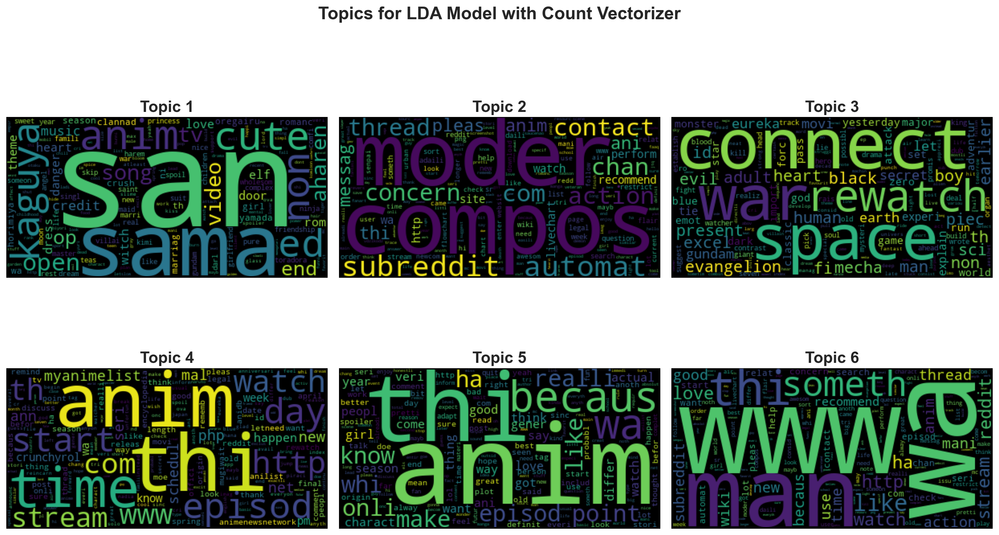

In [48]:
# Displaying topic-wise wordclouds for CountVectorizer model
display_word_cloud(lda_model_count_vec, feature_names_count, sup_title="Topics for LDA Model with Count Vectorizer")

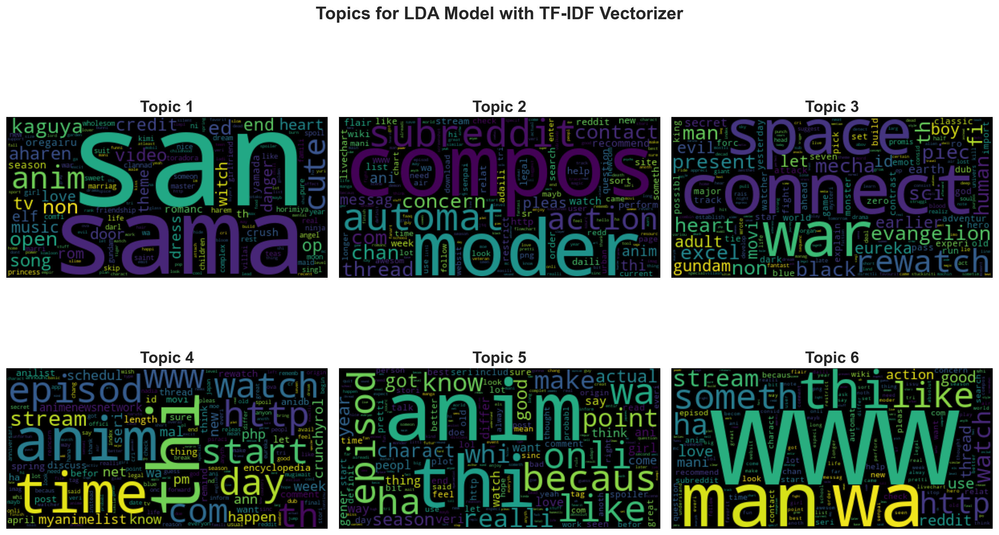

In [47]:
# Displaying topic-wise wordclouds for TF-IDF model
display_word_cloud(lda_model_tfidf_vec, feature_names_tfidf, sup_title="Topics for LDA Model with TF-IDF Vectorizer")